In [1]:
import numpy as np
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import matplotlib.cm as cm
import matplotlib.colors as mplcolors

In [22]:
df_data = pd.read_csv("Results/data_2021.csv")


In [23]:
provinces = list(map(lambda x: x.upper(), df_data['Province'].to_list()))
df_data['Province'] = provinces
df_scores = pd.DataFrame()
df_scores['Province'] = df_data['Province']
df_scores['Index'] = df_data['Index']
df_scores['Culture'] = df_data['Culture']
df_scores['Education'] = df_data['Education']
df_scores['Healthcare'] = df_data['Healthcare']
df_scores['Economy'] = df_data['Economy']
df_scores['NaturalDisasters'] = df_data['NaturalDisasters']

In [24]:
def convert_to_english(lst):
    # Define a dictionary for Turkish to English character conversion
    tr_to_en = {
        'ğ': 'g',
        'Ğ': 'G',
        'ş': 's',
        'Ş': 'S',
        'ı': 'i',
        'İ': 'I',
        'ö': 'o',
        'Ö': 'O',
        'ü': 'u',
        'Ü': 'U',
        'ç': 'c',
        'Ç': 'C'
    }
    return [''.join([tr_to_en[char] if char in tr_to_en else char for char in word]) for word in lst]

# Test the function
words_with_turkish_chars = ["şişe", "ağaç", "öğrenci", "üzüm", "İstanbul"]
print(convert_to_english(words_with_turkish_chars))

['sise', 'agac', 'ogrenci', 'uzum', 'Istanbul']


In [25]:
provinces_en = convert_to_english(df_scores['Province'].to_list())
df_scores['Province'] = provinces_en
df_scores

,Province,Index,Culture,Education,Healthcare,Economy,NaturalDisasters
0,ADANA,32.69,51.43,18.22,53.65,59.73,-55.45
1,ADIYAMAN,13.82,12.70,28.80,23.82,37.48,-50.50
2,AFYONKARAHISAR,41.59,57.70,53.73,39.96,52.30,-40.60
3,AKSARAY,26.92,23.08,43.11,21.76,37.42,-20.80
4,AMASYA,33.99,32.99,73.98,22.92,53.39,-50.50
...,...,...,...,...,...,...,...
76,CORUM,36.32,42.75,64.27,39.25,51.27,-55.45
77,ISTANBUL,54.97,83.11,4.25,61.75,98.08,-30.70
78,IZMIR,50.12,72.19,32.40,62.01,81.02,-50.50
79,SANLIURFA,15.66,21.45,1.00,7.43,50.56,-20.80


In [26]:
shp_tur = gpd.GeoDataFrame()
shp_tur = gpd.read_file("turkey_shape_files/tur.shx")
shp_tur.head()

,adm1_tr,adm1_en,adm1,Shape_Leng,Shape_Area,adm0_en,adm0_tr,adm0,geometry
0,ADANA,ADANA,TUR001,8.271786,1.407083,TURKEY,TÃRKÄ°YE,TUR,"POLYGON ((36.31587 38.36376, 36.31769 38.36367..."
1,ADIYAMAN,ADIYAMAN,TUR002,5.494422,0.750561,TURKEY,TÃRKÄ°YE,TUR,"POLYGON ((39.25297 38.18188, 39.25334 38.18159..."
2,AFYONKARAHÄ°SAR,AFYONKARAHISAR,TUR003,7.149996,1.450064,TURKEY,TÃRKÄ°YE,TUR,"POLYGON ((31.14797 39.26246, 31.15825 39.25753..."
3,AÄRI,AGRI,TUR004,6.588304,1.163170,TURKEY,TÃRKÄ°YE,TUR,"POLYGON ((43.28706 40.01281, 43.29129 40.00884..."
4,AKSARAY,AKSARAY,TUR068,4.432509,0.790388,TURKEY,TÃRKÄ°YE,TUR,"POLYGON ((33.96446 39.03804, 33.96453 39.03723..."


In [27]:
merged = shp_tur.set_index('adm1_en').join(df_scores.set_index('Province'))
merged.drop(columns=['adm1_tr', 'adm0_tr'], axis=1, inplace=True)
merged.head()

,adm1,Shape_Leng,Shape_Area,adm0_en,adm0,geometry,Index,Culture,Education,Healthcare,Economy,NaturalDisasters
adm1_en,,,,,,,,,,,,
ADANA,TUR001,8.271786,1.407083,TURKEY,TUR,"POLYGON ((36.31587 38.36376, 36.31769 38.36367...",32.69,51.43,18.22,53.65,59.73,-55.45
ADIYAMAN,TUR002,5.494422,0.750561,TURKEY,TUR,"POLYGON ((39.25297 38.18188, 39.25334 38.18159...",13.82,12.70,28.80,23.82,37.48,-50.50
AFYONKARAHISAR,TUR003,7.149996,1.450064,TURKEY,TUR,"POLYGON ((31.14797 39.26246, 31.15825 39.25753...",41.59,57.70,53.73,39.96,52.30,-40.60
AGRI,TUR004,6.588304,1.163170,TURKEY,TUR,"POLYGON ((43.28706 40.01281, 43.29129 40.00884...",12.81,10.53,24.76,3.31,45.31,-35.65
AKSARAY,TUR068,4.432509,0.790388,TURKEY,TUR,"POLYGON ((33.96446 39.03804, 33.96453 39.03723...",26.92,23.08,43.11,21.76,37.42,-20.80


In [32]:
def plot_map(df, column, cmap, title):
    fig, ax = plt.subplots(1, figsize=(48, 48))
    ax.axis('off')
    ax.set_title(title,
                 fontdict={'fontsize': '56', 'fontweight' : '18'}, y=1.1)
    fig = df.plot(column=column, cmap=cmap, linewidth=3.0, ax=ax, edgecolor='0.75')

    norm = mplcolors.Normalize(vmin=df[column].min(), vmax=df[column].max())
    cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), 
                 ax=ax, location='right', shrink=0.5, pad=0.005, fraction=0.012)

    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(20)

    df.apply(lambda x: ax.annotate(text=x[column],
                                       xy=(x['geometry'].centroid.x,x['geometry'].centroid.y), ha='center',
                                      fontsize=20), axis=1)

    plt.show()

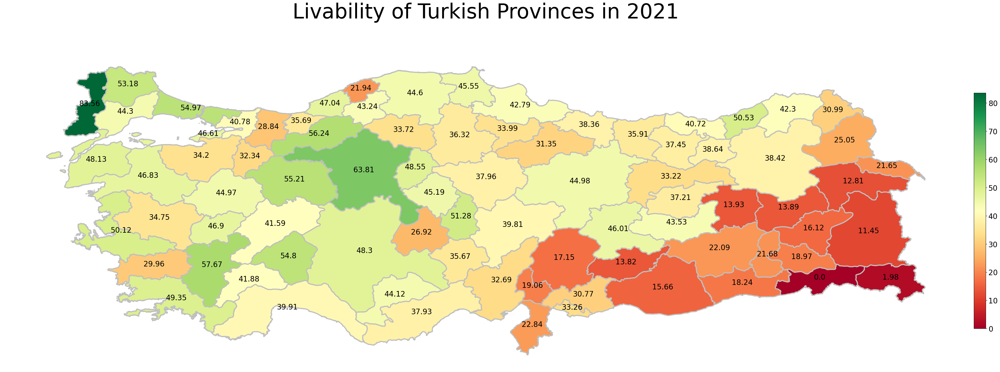

In [33]:
plot_map(merged, 'Index', 'RdYlGn', 'Livability of Turkish Provinces in 2021')

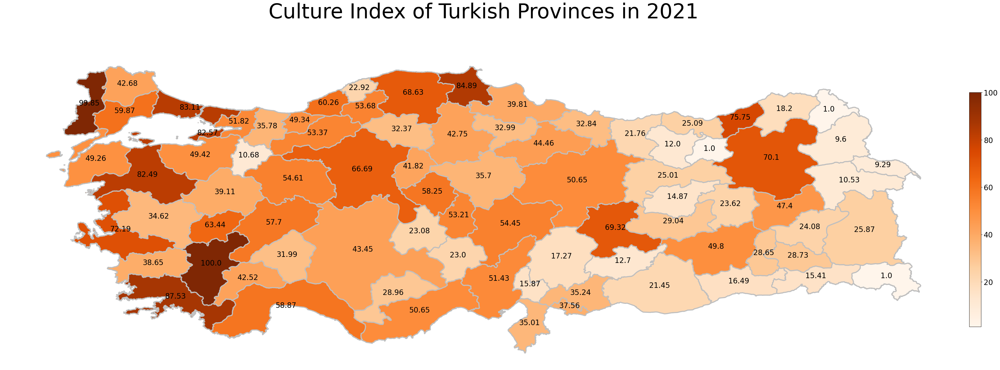

In [34]:
plot_map(merged, 'Culture', 'Oranges', 'Culture Index of Turkish Provinces in 2021')

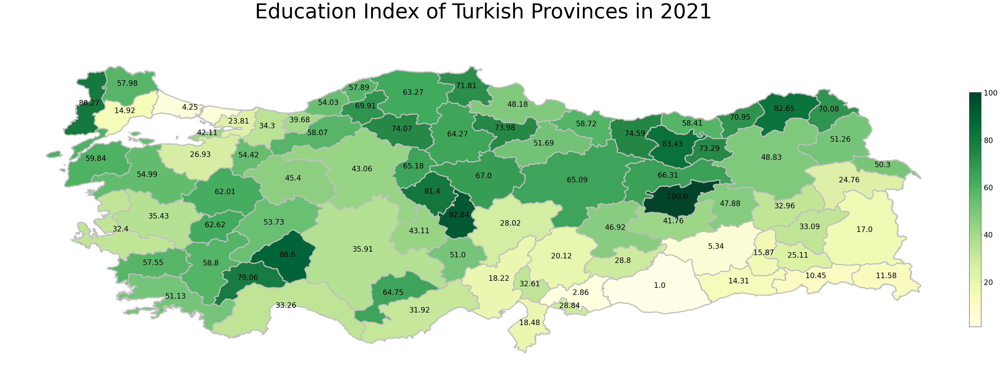

In [35]:
plot_map(merged, 'Education', 'YlGn', 'Education Index of Turkish Provinces in 2021')

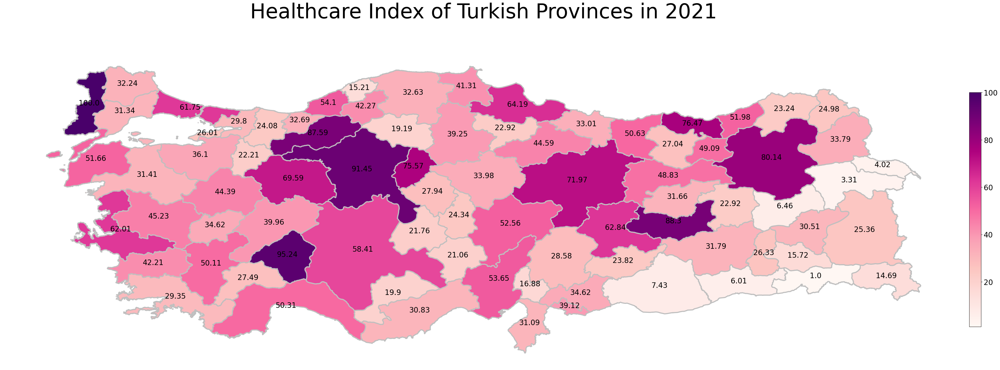

In [36]:
plot_map(merged, 'Healthcare', 'RdPu', 'Healthcare Index of Turkish Provinces in 2021')

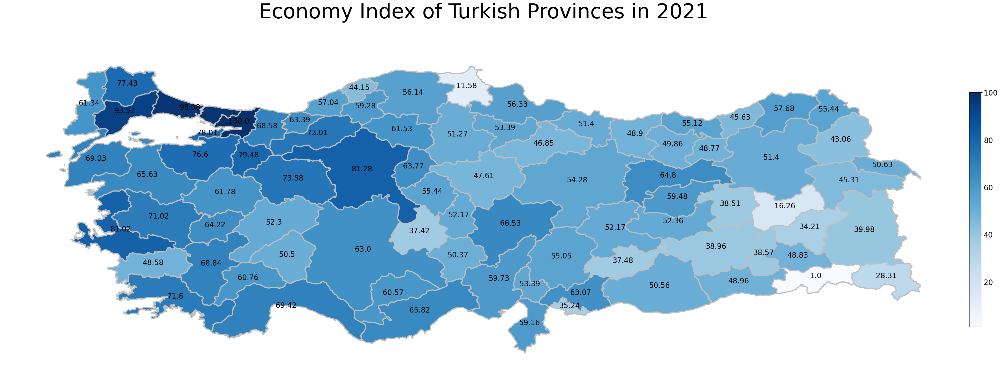

In [37]:
plot_map(merged, 'Economy', 'Blues', 'Economy Index of Turkish Provinces in 2021')

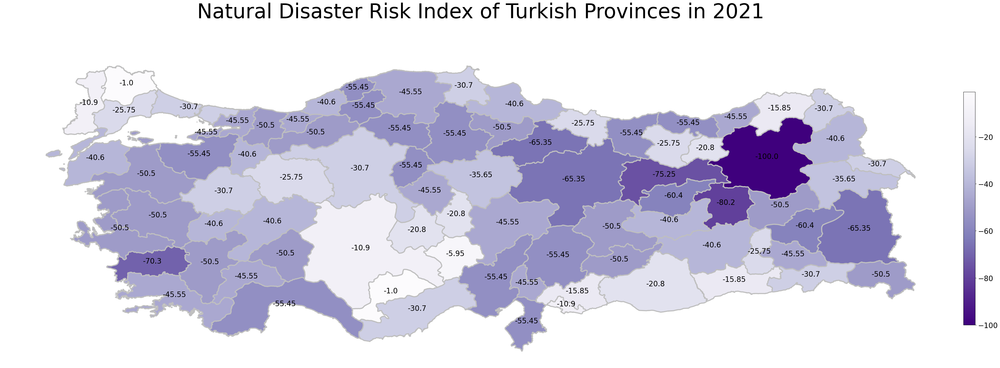

In [40]:
plot_map(merged, 'NaturalDisasters', plt.colormaps['Purples'].reversed(),
         'Natural Disaster Risk Index of Turkish Provinces in 2021')

In [41]:
df_data_2020 = pd.read_csv("Results/data_2020.csv")
df_data_2020['Province'] = provinces
df_scores_2020 = pd.DataFrame()
df_scores_2020['Province'] = df_data_2020['Province']
df_scores_2020['Index'] = df_data_2020['Index']
df_scores_2020['Culture'] = df_data_2020['Culture']
df_scores_2020['Education'] = df_data_2020['Education']
df_scores_2020['Healthcare'] = df_data_2020['Healthcare']
df_scores_2020['Economy'] = df_data_2020['Economy']
df_scores_2020['NaturalDisasters'] = df_data_2020['NaturalDisasters']
df_scores_2020['Province'] = provinces_en
merged_2020 = shp_tur.set_index('adm1_en').join(df_scores_2020.set_index('Province'))
merged_2020.drop(columns=['adm1_tr', 'adm0_tr'], axis=1, inplace=True)

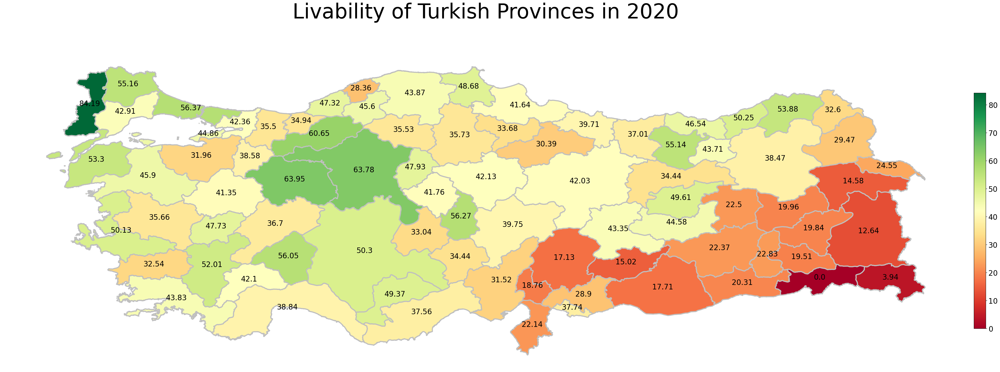

In [42]:
plot_map(merged_2020, 'Index', 'RdYlGn', 'Livability of Turkish Provinces in 2020')

In [43]:
df_data_2019 = pd.read_csv("Results/data_2019.csv")
df_data_2019['Province'] = provinces
df_scores_2019 = pd.DataFrame()
df_scores_2019['Province'] = df_data_2019['Province']
df_scores_2019['Index'] = df_data_2019['Index']
df_scores_2019['Culture'] = df_data_2019['Culture']
df_scores_2019['Education'] = df_data_2019['Education']
df_scores_2019['Healthcare'] = df_data_2019['Healthcare']
df_scores_2019['Economy'] = df_data_2019['Economy']
df_scores_2019['NaturalDisasters'] = df_data_2019['NaturalDisasters']
df_scores_2019['Province'] = provinces_en
merged_2019 = shp_tur.set_index('adm1_en').join(df_scores_2019.set_index('Province'))
merged_2019.drop(columns=['adm1_tr', 'adm0_tr'], axis=1, inplace=True)

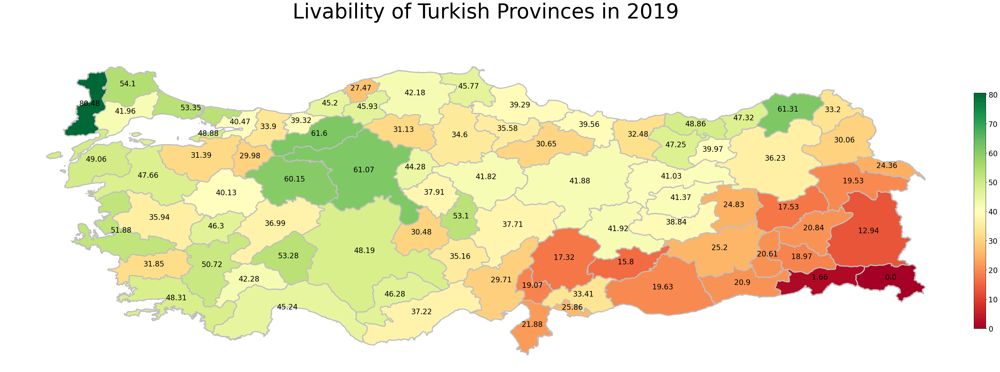

In [44]:
plot_map(merged_2019, 'Index', 'RdYlGn', 'Livability of Turkish Provinces in 2019')

In [45]:
df_data_2018 = pd.read_csv("Results/data_2018.csv")
df_data_2018['Province'] = provinces
df_scores_2018 = pd.DataFrame()
df_scores_2018['Province'] = df_data_2018['Province']
df_scores_2018['Index'] = df_data_2018['Index']
df_scores_2018['Culture'] = df_data_2018['Culture']
df_scores_2018['Education'] = df_data_2018['Education']
df_scores_2018['Healthcare'] = df_data_2018['Healthcare']
df_scores_2018['Economy'] = df_data_2018['Economy']
df_scores_2018['NaturalDisasters'] = df_data_2018['NaturalDisasters']
df_scores_2018['Province'] = provinces_en
merged_2018 = shp_tur.set_index('adm1_en').join(df_scores_2018.set_index('Province'))
merged_2018.drop(columns=['adm1_tr', 'adm0_tr'], axis=1, inplace=True)

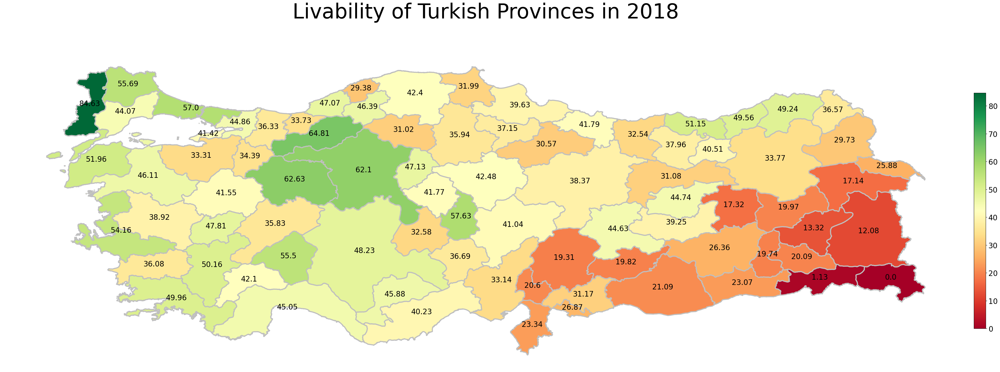

In [46]:
plot_map(merged_2018, 'Index', 'RdYlGn', 'Livability of Turkish Provinces in 2018')

In [47]:
df_data_2017 = pd.read_csv("Results/data_2017.csv")
df_data_2017['Province'] = provinces
df_scores_2017 = pd.DataFrame()
df_scores_2017['Province'] = df_data_2017['Province']
df_scores_2017['Index'] = df_data_2017['Index']
df_scores_2017['Culture'] = df_data_2017['Culture']
df_scores_2017['Education'] = df_data_2017['Education']
df_scores_2017['Healthcare'] = df_data_2017['Healthcare']
df_scores_2017['Economy'] = df_data_2017['Economy']
df_scores_2017['NaturalDisasters'] = df_data_2017['NaturalDisasters']
df_scores_2017['Province'] = provinces_en
merged_2017 = shp_tur.set_index('adm1_en').join(df_scores_2017.set_index('Province'))
merged_2017.drop(columns=['adm1_tr', 'adm0_tr'], axis=1, inplace=True)

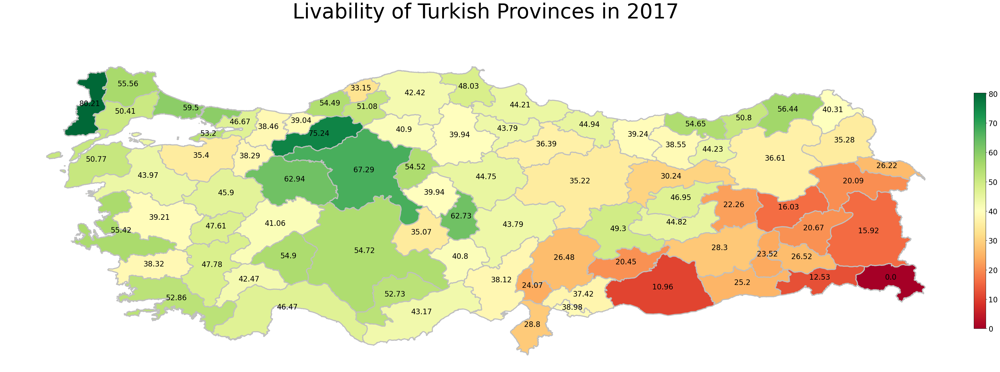

In [48]:
plot_map(merged_2017, 'Index', 'RdYlGn', 'Livability of Turkish Provinces in 2017')